In [1]:
import os 
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras 
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm
from imblearn.over_sampling import SMOTE

In [ ]:
images = []
labels = []
for subfolder in tqdm(os.listdir('./dataset')):
    subfolder_path = os.path.join('./dataset', subfolder)
    for folder in os.listdir(subfolder_path):
        subfolder_path2=os.path.join(subfolder_path,folder)
        for image_filename in os.listdir(subfolder_path2):
            image_path = os.path.join(subfolder_path2, image_filename)
            images.append(image_path)
            labels.append(folder)
df = pd.DataFrame({'image': images, 'label': labels})
df

100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


,image,label
0,/kaggle/input/alzheimers-multiclass-dataset-eq...,ModerateDemented
1,/kaggle/input/alzheimers-multiclass-dataset-eq...,ModerateDemented
2,/kaggle/input/alzheimers-multiclass-dataset-eq...,ModerateDemented
3,/kaggle/input/alzheimers-multiclass-dataset-eq...,ModerateDemented
4,/kaggle/input/alzheimers-multiclass-dataset-eq...,ModerateDemented
...,...,...
43995,/kaggle/input/alzheimers-multiclass-dataset-eq...,MildDemented
43996,/kaggle/input/alzheimers-multiclass-dataset-eq...,MildDemented
43997,/kaggle/input/alzheimers-multiclass-dataset-eq...,MildDemented
43998,/kaggle/input/alzheimers-multiclass-dataset-eq...,MildDemented


Exact counts for each class:
label
NonDemented         12800
VeryMildDemented    11200
ModerateDemented    10000
MildDemented        10000
Name: count, dtype: int64


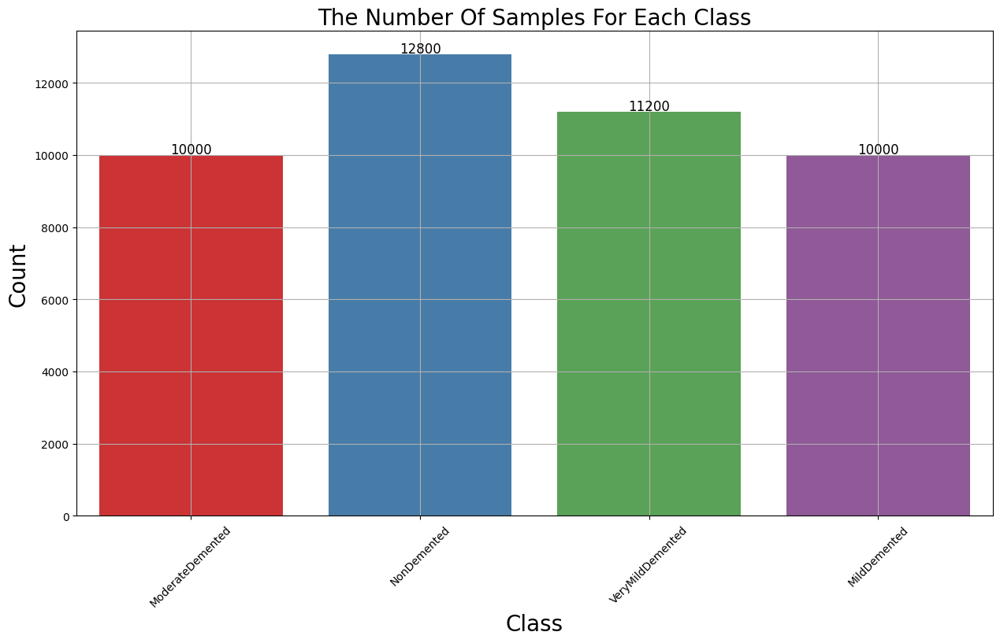

In [3]:
# Assuming `df` is your DataFrame and `label` is the column with class labels
class_counts = df['label'].value_counts()

# Print exact counts
print("Exact counts for each class:")
print(class_counts)

# Plot the class distribution
plt.figure(figsize=(15, 8))
ax = sns.countplot(x=df['label'], palette='Set1')
ax.set_xlabel("Class", fontsize=20)
ax.set_ylabel("Count", fontsize=20)
plt.title('The Number Of Samples For Each Class', fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)

# Annotate each bar with the exact count
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), 
                textcoords='offset points')

plt.show()

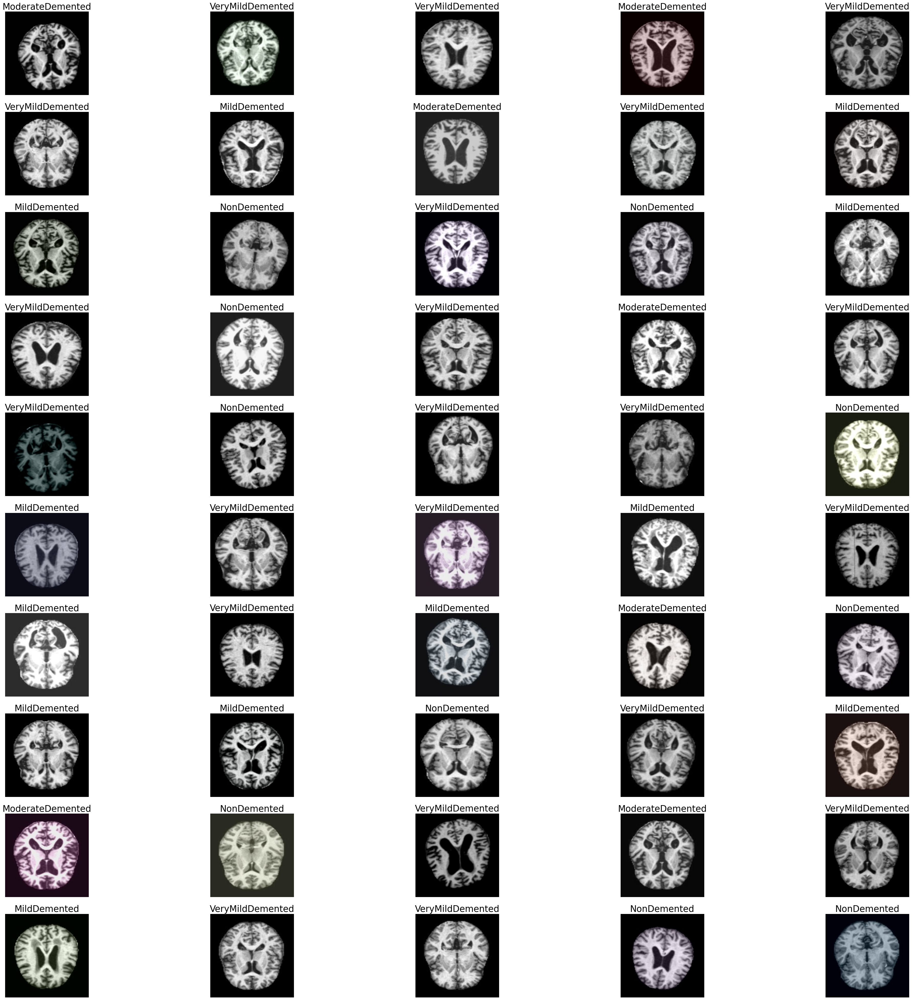

In [4]:
plt.figure(figsize=(50,50))
for n,i in enumerate(np.random.randint(0,len(df),50)):
    plt.subplot(10,5,n+1)
    img=cv2.imread(df.image[i])
    img=cv2.resize(img,(224,224))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')
    plt.title(df.label[i],fontsize=25)

In [5]:
X_train, X_test1, y_train, y_test1 = train_test_split(df['image'], df['label'], test_size=0.2, random_state=42,shuffle=True,stratify=df['label'])
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)
df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})

In [6]:
image_size = (224,224)
batch_size = 32
datagen = ImageDataGenerator(
    preprocessing_function= tf.keras.applications.resnet.preprocess_input,
    rescale=1./255,
    horizontal_flip=True
)
train_generator = datagen.flow_from_dataframe(
    df_train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)
test_generator = datagen.flow_from_dataframe(
    df_test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)
val_generator = datagen.flow_from_dataframe(
    df_val,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

Found 35200 validated image filenames belonging to 4 classes.
Found 4400 validated image filenames belonging to 4 classes.
Found 4400 validated image filenames belonging to 4 classes.


In [7]:
class_num=list(train_generator.class_indices.keys())
class_num

['MildDemented', 'ModerateDemented', 'NonDemented', 'VeryMildDemented']

In [8]:
import tensorflow as tf
from tensorflow import keras

model = keras.models.Sequential()
model.add(tf.keras.applications.VGG16(input_shape=(224, 224, 3), include_top=False, pooling='avg', weights='imagenet'))
model.add(keras.layers.Flatten())
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Dense(2048, activation='relu'))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Dense(1024, activation='relu'))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Dense(4, activation='softmax'))
model.layers[0].trainable = False

# Build the model with the correct input shape
model.build(input_shape=(None, 224, 224, 3))
model.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 512)            │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2048)           │     1,050,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,881,924 (68.21 MB)

 Trainable params: 3,160,068 (12.05 MB)

 Non-trainable params: 14,721,856 (56.16 MB)

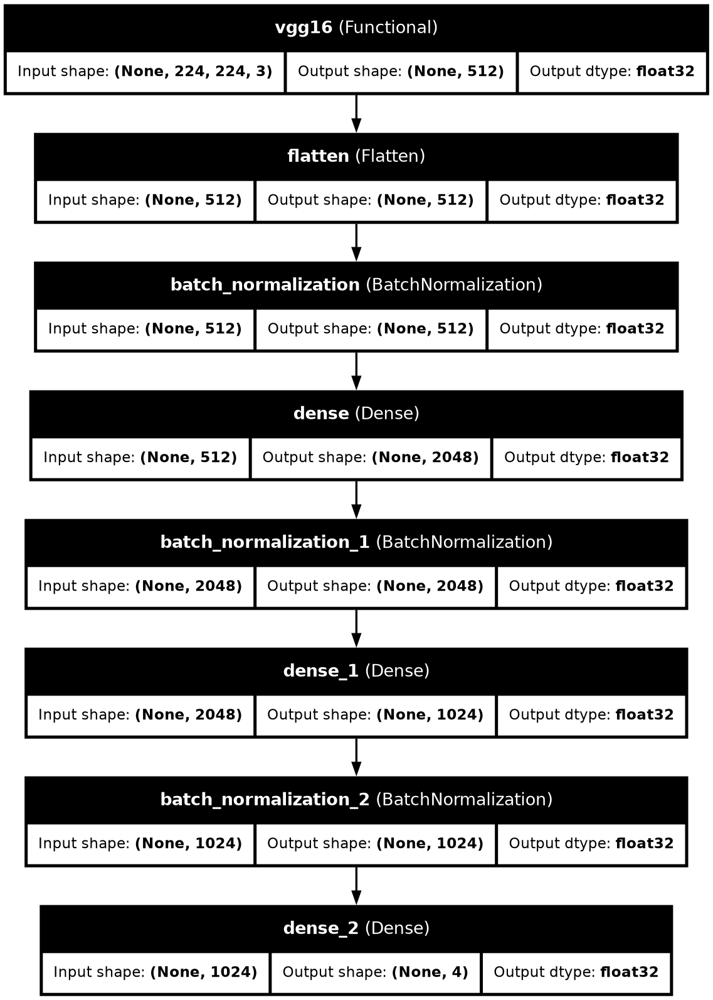

In [9]:
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

In [10]:
checkpoint_cb = ModelCheckpoint("model_VGG16.keras", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=10, restore_best_weights=True)
model.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=['accuracy'])
hist = model.fit(train_generator, epochs=20, validation_data=val_generator, callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/20


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1757193708.987437     105 service.cc:145] XLA service 0x7cdec0009250 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1757193708.987495     105 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1757193708.987500     105 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


   1/1100 ━━━━━━━━━━━━━━━━━━━━ 5:53:32 19s/step - accuracy: 0.1562 - loss: 2.1170

I0000 00:00:1757193723.759105     105 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1100/1100 ━━━━━━━━━━━━━━━━━━━━ 325s 278ms/step - accuracy: 0.7031 - loss: 0.9321 - val_accuracy: 0.8718 - val_loss: 0.3169
Epoch 2/20
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 160s 145ms/step - accuracy: 0.8698 - loss: 0.3401 - val_accuracy: 0.9093 - val_loss: 0.2543
Epoch 3/20
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 159s 144ms/step - accuracy: 0.9101 - loss: 0.2341 - val_accuracy: 0.9366 - val_loss: 0.1770
Epoch 4/20
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 160s 145ms/step - accuracy: 0.9327 - loss: 0.1836 - val_accuracy: 0.9407 - val_loss: 0.1535
Epoch 5/20
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 160s 145ms/step - accuracy: 0.9424 - loss: 0.1556 - val_accuracy: 0.9493 - val_loss: 0.1406
Epoch 6/20
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 159s 144ms/step - accuracy: 0.9502 - loss: 0.1314 - val_accuracy: 0.9582 - val_loss: 0.1253
Epoch 7/20
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 160s 145ms/step - accuracy: 0.9582 - loss: 0.1120 - val_accuracy: 0.9657 - val_loss: 0.1052
Epoch 8/20
1100/1100 ━━━━━━━━━━━━━━━━━━━━ 160s 145ms/step - accuracy: 0.9

In [11]:
model.save('/kaggle/working/model_VGG16.keras')
model.export('/kaggle/working/model_VGG16')

Saved artifact at '/kaggle/working/model_VGG16'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_20')
Output Type:
  TensorSpec(shape=(None, 4), dtype=tf.float32, name=None)
Captures:
  137298359737456: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137298359738336: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137298359739216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137298359739040: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137298359743616: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137298359733760: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137298359567456: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137298359567808: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137298359572032: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137298359570800: TensorSpec(shape=(), dtype=tf.resource, name=None)
  

In [12]:
import os
print(os.listdir('/kaggle/working'))

['.virtual_documents', 'model_VGG16', 'model_VGG16.keras', 'model.png']


In [13]:
hist_=pd.DataFrame(hist.history)
hist_

,accuracy,loss,val_accuracy,val_loss
0,0.774063,0.603897,0.871818,0.316850
1,0.878494,0.314306,0.909318,0.254308
2,0.912670,0.228979,0.936591,0.176957
3,0.931591,0.182381,0.940682,0.153488
4,0.943381,0.156601,0.949318,0.140620
5,0.951335,0.131074,0.958182,0.125268
6,0.956250,0.116528,0.965682,0.105210
7,0.965909,0.096573,0.971818,0.083866
8,0.968097,0.088447,0.970909,0.080167
9,0.969972,0.083502,0.973409,0.082468


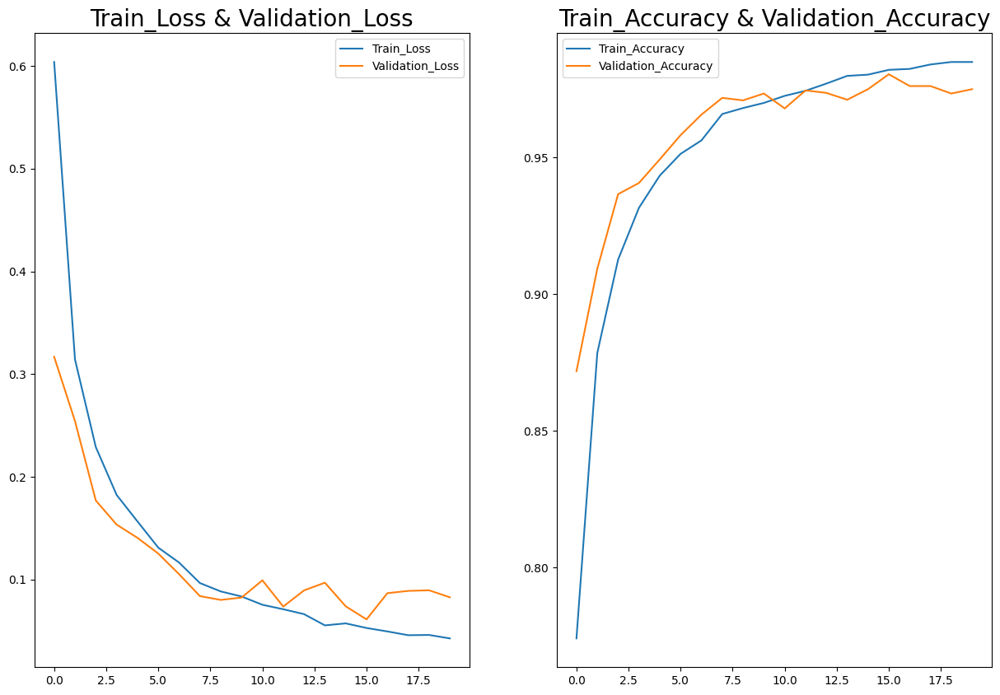

In [14]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.show()

In [15]:
score, acc= model.evaluate(test_generator)
print('Val Loss =', score)
print('Val Accuracy =', acc)

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


138/138 ━━━━━━━━━━━━━━━━━━━━ 38s 275ms/step - accuracy: 0.9789 - loss: 0.0791
Val Loss = 0.07495931535959244
Val Accuracy = 0.9795454740524292


In [16]:
y_test =test_generator.classes
predictions = model.predict(test_generator)
y_pred = np.argmax(predictions,axis=1)
y_test = np.ravel(y_test)
y_pred = np.ravel(y_pred)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
df

138/138 ━━━━━━━━━━━━━━━━━━━━ 19s 131ms/step


,Actual,Prediction
0,0,0
1,3,3
2,1,1
3,1,1
4,2,2
...,...,...
4395,2,2
4396,3,3
4397,3,3
4398,0,0


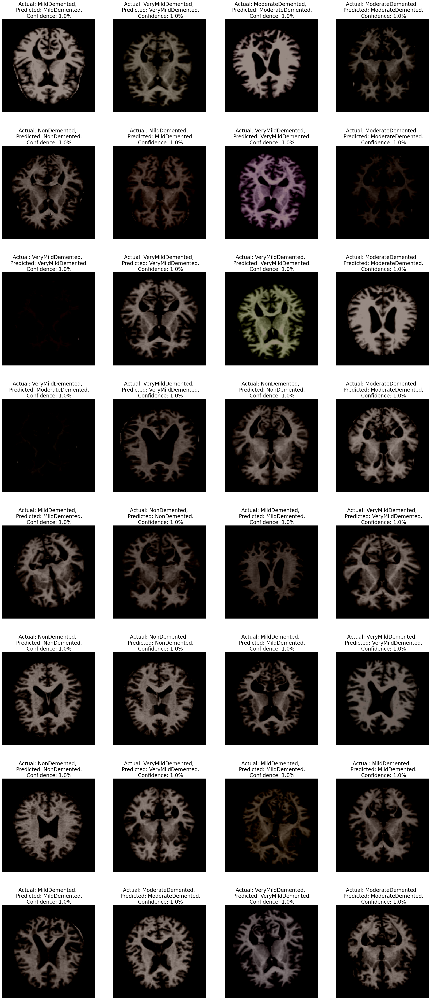

In [17]:
plt.figure(figsize=(30,70))
batch = next(test_generator)
images= batch[0]
for n in range(32):
    plt.subplot(8,4,n+1)
    plt.imshow(images[n])
    plt.axis('off')
    plt.title(f"Actual: {class_num[y_test[n]]}, \n Predicted: {class_num[y_pred[n]]}.\n Confidence: {round(predictions[n][np.argmax(predictions[n])],0)}%",fontsize=20)

array([[ 983,    0,    8,    9],
       [   0, 1000,    0,    0],
       [   7,    1, 1252,   20],
       [  23,    2,   23, 1072]])

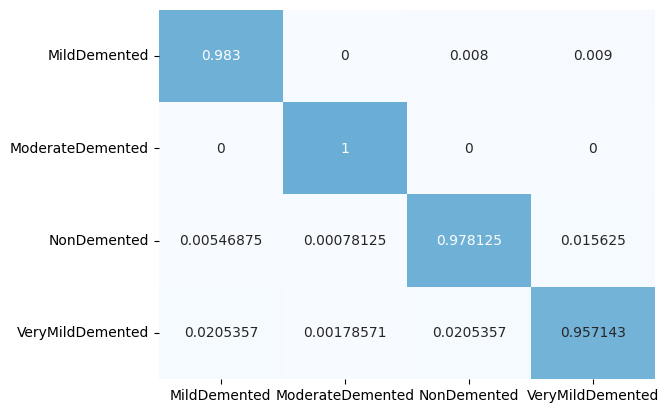

In [18]:
CM = confusion_matrix(y_test,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues',xticklabels=class_num, yticklabels=class_num)
CM

In [19]:
ClassificationReport = classification_report(y_test,y_pred,target_names=class_num)
print('Classification Report is : ', ClassificationReport)

Classification Report is :                    precision    recall  f1-score   support

    MildDemented       0.97      0.98      0.98      1000
ModerateDemented       1.00      1.00      1.00      1000
     NonDemented       0.98      0.98      0.98      1280
VeryMildDemented       0.97      0.96      0.97      1120

        accuracy                           0.98      4400
       macro avg       0.98      0.98      0.98      4400
    weighted avg       0.98      0.98      0.98      4400



In [20]:
import pandas as pd
import numpy as np

# Save the training history to a CSV file
hist_df_vgg16 = pd.DataFrame(hist.history)
hist_df_vgg16.to_csv('history_vgg16.csv', index=False)

# Save the predictions and true labels to numpy files
np.save('predictions_vgg16.npy', predictions)
np.save('y_test_labels.npy', y_test) # You only need to save this once

print("VGG16 results saved successfully!")

VGG16 results saved successfully!


In [21]:
# class_num=list(train_generator.class_indices.keys())
# class_num

In [22]:
# from tensorflow.keras.preprocessing.image import load_img, img_to_array
# import numpy as np
# import matplotlib.pyplot as plt

# def predict_single_image(model, image_path, class_num, target_size=(224, 224)):
#     """
#     Predicts the class of a single image and displays it with the prediction and confidence.
    
#     Args:
#         model: Trained Keras model.
#         image_path (str): Path to the image file.
#         class_num (dict): Dictionary mapping class indices to class labels.
#         target_size (tuple): Target size for resizing the image.
#     """
#     # Load and preprocess the image
#     image = load_img(image_path, target_size=target_size)
#     image_array = img_to_array(image)  # Convert to numpy array
#     image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension
#     image_array = image_array / 255.0  # Normalize
    
#     # Predict
#     predictions = model.predict(image_array)
#     predicted_class_index = np.argmax(predictions)
#     predicted_class_label = class_num[predicted_class_index]
#     confidence = round(np.max(predictions) * 100, 2)
    
#     # Display the image and prediction
#     plt.imshow(image)
#     plt.axis('off')
#     plt.title(f"Predicted: {predicted_class_label}\nConfidence: {confidence}%", fontsize=16)
#     plt.show()

# # Example Usage
# image_path = "/kaggle/input/alzheimers-multiclass-dataset-equal-and-augmented/combined_images/VeryMildDemented/0073c8fe-469d-4160-9344-37d61ac6f9bd.jpg"
# class_num = {0: 'MildDemented', 1: 'ModerateDemented', 2: 'NonDemented', 3: 'VeryMildDemented'}
# predict_single_image(model, image_path, class_num)
